# Data Driven Prediction of NFL Player Salaries

Jonas da Silva

Senay Alemayehu

Andrew Mendez

Sean Sweeny

Introduction:

The National Football League (NFL) stands as a multi-billion dollar industry with a massive global fanbase. Fans invest significant amounts of time and resources to follow and support their favorite teams and players. Teams, in turn, strive to fulfill their duty to the fans by providing the best possible experience, whether through stadium renovations or building winning teams that captivate viewers. Each year, teams allocate approximately 225 million dollars to player salaries through contracts. On the surface, it seems straightforward - teams spend money on players they believe will benefit the team, and success follows. However, the reality is far more nuanced and complex.

Teams often find themselves making critical decisions that impact their financial investments. There are instances where players are overpaid, leading to adverse effects on team performance. Conversely, teams may pass on certain players who turn out to be valuable assets for other teams. Furthermore, determining the worth of each position becomes an intricate matter. Positions hold varying levels of importance within a team's strategy, thereby influencing their respective salaries. Other factors, such as age and past performance, must also be considered. However, even with a meticulous evaluation process, outcomes may still deviate from expectations due to factors like work ethic, fluctuating performance, or unpredictable anomalies.

With this in mind, we aim to address the following question: which factors can be reliably accounted for when determining player salaries? To answer this question, we will explore both basic box score predictions and the ProFootballFocus grading system, which provides a comprehensive breakdown of every play by every player. This contextual analysis adds depth to traditional statistics, which can sometimes be misleading. For example, a quarterback may deliver a perfect pass that is dropped, resulting in an incomplete pass. Our analysis will encompass a wide range of statistics, both advanced and fundamental, to ascertain their correlation with player salaries and determine the extent of their impact. This will provide valuable insights into how past performance can be used to predict a player's worth and the value they bring to a team.

To achieve this, we will delve into various categories, such as passing, rushing, receiving, blocking, run defense, pass rush, and coverage. By individually examining each category, we can analyze different positions and distinguish the value associated with specific skills. Through this comprehensive exploration, we aim to shed light on the factors that best correlate with salary and improve our ability to predict a player's monetary value based on their performance history.

In [1162]:
import pandas as pd
import numpy as np
import warnings

# filter out warnings
warnings.filterwarnings('ignore')

# get salary data 
tables = pd.read_html('https://www.spotrac.com/nfl/contracts/sort-value/limit-2000/', flavor='html5lib')

In the code above, we import the pandas library as pd and numpy library as np. We also import the warnings module to suppress any warning messages.

Next, we use the pd.read_html() function to read the HTML content from the specified URL. The flavor='html5lib' parameter ensures that the HTML is parsed correctly. The function returns a list of DataFrame objects, with each DataFrame representing a table from the HTML content.

In our case, we assume that the desired table is present on the webpage and will be accessible at the first index of the returned list (tables[0]). However, it's important to note that the HTML structure of the webpage might change over time, so it's always good to verify that the table is being extracted correctly.

The table contains various columns of data, including player salary information such as signing date, total value, average annual value (AAV), and details regarding guaranteed salary.

Once we have successfully obtained the salary data in a DataFrame, we can proceed with further exploratory data analysis and hypothesis testing to gain insights into the relationship between salaries and player performance.First we must collect data, to do this we used the python library Pandas to read the html. Since the website we are collecting from https://www.spotrac.com/nfl/contracts/sort-value/limit-2000/ stores the data we're looking for in a table tag we can easily grab it and store it in a dataframe. This website contains information for players salary including when they signed, total value, average annual value (AAV), and information relating to guaranteed salary.

In [1163]:
import re

salary_df = tables[0].rename(columns={'Player': 'player'})
players = salary_df['player']
pl = []
start_years = []
end_years = []

for player in players:
    try:
        # split up player column and extract start year end year and name
        groups = re.search(r'(.*)  .* \| (\d{4})-(\d{4}) \(FA: (\d{4})\)', player)
        pl.append(groups.groups()[0])
        start_years.append(groups.groups()[1])
        end_years.append(groups.groups()[2])
    # if regex fails dont throw error
    except:
        pl.append(None)
        start_years.append(None)
        end_years.append(None)

# insert clean data
salary_df['player'] = pl
salary_df['start_year'] = start_years
salary_df['end_year'] = end_years

# turn salaries totals into ints
def convert_to_int(v):
    try: return int(v.replace('$', '').replace(',',''))
    except: return 0


salary_df['Value'] = salary_df['Value'].apply(convert_to_int)
salary_df['AAV'] = salary_df['AAV'].apply(convert_to_int)
salary_df['Sign Bonus'] = salary_df['Sign Bonus'].apply(convert_to_int)
salary_df["G'teed @ Sign"] = salary_df["G'teed @ Sign"].apply(convert_to_int)
salary_df["Practical G'teed"] = salary_df["Practical G'teed"].apply(convert_to_int)
salary_df['start_year'] = salary_df['start_year'].apply(convert_to_int)
salary_df['end_year'] = salary_df['end_year'].apply(convert_to_int)
salary_df.fillna(0)
salary_df.head()

,Rank,player,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,1,Patrick Mahomes,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031
1,2,Lamar Jackson,26,5,260000000,52000000,72500000,135000000,185000000,2023,2027
2,3,Josh Allen,25,6,258034000,43005667,16500000,100038596,150000000,2021,2028
3,4,Jalen Hurts,24,5,255000000,51000000,23294000,110000000,179399000,2023,2028
4,5,Russell Wilson,33,5,242588236,48517647,50000000,124000000,161000000,2022,2028


Now we need to get the player stats. Do do this we extracted csv files from https://www.pff.com/ which contain many useful statistics for each position. Again we are going to store this in a pandas dataframe to be consistent, since we will use all the datasets together. We also need to clean the data. We do this by melting the data and removing any years in which very minimal snaps were played and to only include positions we want. We want to differentiate the years because of how important it is to account for. A player having a good season 5 years ago is not nearly the same as them playing well in the last season.

In [1164]:
# passing players and stats

passing_dfs = []

# passing

# 2022
passing_dfs.append(pd.read_csv('./passing/passing_summary.csv'))
passing_dfs[0]['year'] = 2022

# 2021
passing_dfs.append(pd.read_csv('./passing/passing_summary (1).csv'))
passing_dfs[1]['year'] = 2021

# 2020
passing_dfs.append(pd.read_csv('./passing/passing_summary (2).csv'))
passing_dfs[2]['year'] = 2020

# 2019
passing_dfs.append(pd.read_csv('./passing/passing_summary (3).csv'))
passing_dfs[3]['year'] = 2019

# 2018
passing_dfs.append(pd.read_csv('./passing/passing_summary (4).csv'))
passing_dfs[4]['year'] = 2018


# 2017
passing_dfs.append(pd.read_csv('./passing/passing_summary (5).csv'))
passing_dfs[5]['year'] = 2017

# create dataframe
passing_df = pd.concat(passing_dfs)

# remove outliers
passing_df = passing_df[passing_df['position'] == 'QB']
passing_df = passing_df[passing_df['attempts'] > 100]

# merge players with salary
passing_df = pd.merge(passing_df, salary_df, on='player')
passing_df.head()

,player,player_id,position,team_name,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Patrick Mahomes,11765,QB,KC,20,78.0,685,747,7.5,2.85,...,1,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031
1,Patrick Mahomes,11765,QB,KC,20,79.2,708,780,7.4,2.87,...,1,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031
2,Patrick Mahomes,11765,QB,KC,18,77.1,656,705,8.5,2.91,...,1,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031
3,Patrick Mahomes,11765,QB,KC,17,77.2,549,596,8.5,2.84,...,1,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031
4,Patrick Mahomes,11765,QB,KC,18,77.8,595,652,9.6,2.80,...,1,24,10,450000000,45000000,10000000,63081905,141481905,2020,2031


Here are the rushing stats, we will limit these to just running backs.

In [1165]:
# rushing players and stats

rushing_dfs = []

# rushing

# 2022
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary.csv'))
rushing_dfs[0]['year'] = 2022

# 2021
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (1).csv'))
rushing_dfs[1]['year'] = 2021

# 2020
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (2).csv'))
rushing_dfs[2]['year'] = 2020

# 2019
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (3).csv'))
rushing_dfs[3]['year'] = 2019

# 2018
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (4).csv'))
rushing_dfs[4]['year'] = 2018


# 2017
rushing_dfs.append(pd.read_csv('./rushing/rushing_summary (5).csv'))
rushing_dfs[5]['year'] = 2017

# create dataframe
rushing_df = pd.concat(rushing_dfs)

# remove outliers
rushing_df = rushing_df[rushing_df['position'] == 'HB']
rushing_df = rushing_df[rushing_df['attempts'] > 50]

# merge players with salary
rushing_df = pd.merge(rushing_df, salary_df, on='player')
rushing_df.head()

,player,player_id,position,team_name,player_game_count,attempts,avoided_tackles,breakaway_attempts,breakaway_percent,breakaway_yards,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Derrick Henry,10679,HB,TEN,16,349,69,15,27.6,424,...,142,26,4,50000000,12500000,12000000,25500000,25500000,2020,2023
1,Derrick Henry,10679,HB,TEN,9,239,36,9,26.4,264,...,142,26,4,50000000,12500000,12000000,25500000,25500000,2020,2023
2,Derrick Henry,10679,HB,TEN,17,396,77,21,31.2,645,...,142,26,4,50000000,12500000,12000000,25500000,25500000,2020,2023
3,Derrick Henry,10679,HB,TEN,18,386,71,23,33.5,665,...,142,26,4,50000000,12500000,12000000,25500000,25500000,2020,2023
4,Derrick Henry,10679,HB,TEN,16,215,45,9,27.6,292,...,142,26,4,50000000,12500000,12000000,25500000,25500000,2020,2023


Here are receiving stats. These are a little more complicated since these will contain primary statistics for tight ends and wide receivers. We will use the data from these files for two seperate dataframes one for the wide receivers and one for the tight ends.

In [1166]:
# receiving players and stats

receiving_dfs = []

# receiving

# 2022
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary.csv'))
receiving_dfs[0]['year'] = 2022

# 2021
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (1).csv'))
receiving_dfs[1]['year'] = 2021

# 2020
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (2).csv'))
receiving_dfs[2]['year'] = 2020

# 2019
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (3).csv'))
receiving_dfs[3]['year'] = 2019

# 2018
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (4).csv'))
receiving_dfs[4]['year'] = 2018


# 2017
receiving_dfs.append(pd.read_csv('./receiving/receiving_summary (5).csv'))
receiving_dfs[5]['year'] = 2017

# create dataframe
receiving_df = pd.concat(receiving_dfs)

# remove outliers
receiving_df = receiving_df[receiving_df['targets'] > 50]

# merge players with salary
receiving_df = pd.merge(receiving_df, salary_df, on='player')
receiving_df.head()

,player,player_id,position,team_name,player_game_count,avg_depth_of_target,avoided_tackles,caught_percent,contested_catch_rate,contested_receptions,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Justin Jefferson,61398,WR,MIN,18,10.7,11,73.0,55.0,22,...,422,21,4,13122805,3280701,7103856,13122805,13122805,2020,2024
1,Justin Jefferson,61398,WR,MIN,17,13.3,9,66.3,48.1,13,...,422,21,4,13122805,3280701,7103856,13122805,13122805,2020,2024
2,Justin Jefferson,61398,WR,MIN,16,12.0,13,72.7,54.5,12,...,422,21,4,13122805,3280701,7103856,13122805,13122805,2020,2024
3,Travis Kelce,7844,TE,KC,20,7.5,25,75.3,45.5,10,...,115,30,4,57250000,14312500,0,20750000,22750000,2020,2025
4,Travis Kelce,7844,TE,KC,19,7.6,23,72.8,60.0,9,...,115,30,4,57250000,14312500,0,20750000,22750000,2020,2025


In [1167]:
# get wide receiver data
wr_df = receiving_df[receiving_df['position'] == 'WR']
wr_df.head()

,player,player_id,position,team_name,player_game_count,avg_depth_of_target,avoided_tackles,caught_percent,contested_catch_rate,contested_receptions,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Justin Jefferson,61398,WR,MIN,18,10.7,11,73.0,55.0,22,...,422,21,4,13122805,3280701,7103856,13122805,13122805,2020,2024
1,Justin Jefferson,61398,WR,MIN,17,13.3,9,66.3,48.1,13,...,422,21,4,13122805,3280701,7103856,13122805,13122805,2020,2024
2,Justin Jefferson,61398,WR,MIN,16,12.0,13,72.7,54.5,12,...,422,21,4,13122805,3280701,7103856,13122805,13122805,2020,2024
9,Tyreek Hill,10799,WR,MIA,18,12.6,12,69.6,50.0,13,...,19,28,4,120000000,30000000,25500000,52535000,72200000,2022,2026
10,Tyreek Hill,10799,WR,KC,20,10.6,15,73.6,28.6,6,...,19,28,4,120000000,30000000,25500000,52535000,72200000,2022,2026


In [1168]:
# tight end data
te_df = receiving_df[receiving_df['position'] == 'TE']
te_df.head()

,player,player_id,position,team_name,player_game_count,avg_depth_of_target,avoided_tackles,caught_percent,contested_catch_rate,contested_receptions,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
3,Travis Kelce,7844,TE,KC,20,7.5,25,75.3,45.5,10,...,115,30,4,57250000,14312500,0,20750000,22750000,2020,2025
4,Travis Kelce,7844,TE,KC,19,7.6,23,72.8,60.0,9,...,115,30,4,57250000,14312500,0,20750000,22750000,2020,2025
5,Travis Kelce,7844,TE,KC,18,8.9,16,76.4,30.4,7,...,115,30,4,57250000,14312500,0,20750000,22750000,2020,2025
6,Travis Kelce,7844,TE,KC,19,9.1,18,76.3,53.8,14,...,115,30,4,57250000,14312500,0,20750000,22750000,2020,2025
7,Travis Kelce,7844,TE,KC,18,9.3,11,73.4,64.0,16,...,115,30,4,57250000,14312500,0,20750000,22750000,2020,2025


Here are the blocking stats. These contain primary stats for offensive lineman which are typically broken down into 3 positions. Center, guard and tackle. We will create three seperate dataframes for this reason.

In [1169]:
# offense_blocking players and stats

offense_blocking_dfs = []

# offense_blocking

# 2022
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking.csv'))
offense_blocking_dfs[0]['year'] = 2022

# 2021
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (1).csv'))
offense_blocking_dfs[1]['year'] = 2021

# 2020
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (2).csv'))
offense_blocking_dfs[2]['year'] = 2020

# 2019
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (3).csv'))
offense_blocking_dfs[3]['year'] = 2019

# 2018
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (4).csv'))
offense_blocking_dfs[4]['year'] = 2018


# 2017
offense_blocking_dfs.append(pd.read_csv('./offense_blocking/offense_blocking (5).csv'))
offense_blocking_dfs[5]['year'] = 2017

# create dataframe
offense_blocking_df = pd.concat(offense_blocking_dfs)

# remove outliers
offense_blocking_df = offense_blocking_df[offense_blocking_df['snap_counts_block'] > 100]

# merge players with salary
offense_blocking_df = pd.merge(offense_blocking_df, salary_df, on='player')
offense_blocking_df.head()

,player,player_id,position,team_name,player_game_count,block_percent,declined_penalties,franchise_id,grades_offense,grades_pass_block,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Jason Kelce,6343,C,PHI,20,100.0,1,24,89.4,83.3,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
1,Jason Kelce,6343,C,PHI,18,100.0,0,24,84.5,69.2,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
2,Jason Kelce,6343,C,PHI,16,100.0,0,24,69.6,62.0,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
3,Jason Kelce,6343,C,PHI,17,100.0,1,24,81.1,67.6,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
4,Jason Kelce,6343,C,PHI,18,100.0,0,24,87.1,88.0,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023


In [1170]:
# center data
c_df = offense_blocking_df[offense_blocking_df['position'] == 'C']
c_df.head()

,player,player_id,position,team_name,player_game_count,block_percent,declined_penalties,franchise_id,grades_offense,grades_pass_block,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Jason Kelce,6343,C,PHI,20,100.0,1,24,89.4,83.3,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
1,Jason Kelce,6343,C,PHI,18,100.0,0,24,84.5,69.2,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
2,Jason Kelce,6343,C,PHI,16,100.0,0,24,69.6,62.0,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
3,Jason Kelce,6343,C,PHI,17,100.0,1,24,81.1,67.6,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023
4,Jason Kelce,6343,C,PHI,18,100.0,0,24,87.1,88.0,...,389,35,1,14250000,14250000,10335000,14250000,14250000,2023,2023


In [1171]:
# guard data
g_df = offense_blocking_df[offense_blocking_df['position'] == 'G']
g_df.head()

,player,player_id,position,team_name,player_game_count,block_percent,declined_penalties,franchise_id,grades_offense,grades_pass_block,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
6,Isaac Seumalo,10713,G,PHI,20,100.0,3,24,72.7,78.2,...,257,29,3,24000000,8000000,6950000,6950000,6950000,2023,2025
7,Isaac Seumalo,10713,G,PHI,3,100.0,0,24,74.8,82.9,...,257,29,3,24000000,8000000,6950000,6950000,6950000,2023,2025
8,Isaac Seumalo,10713,G,PHI,9,100.0,0,24,62.4,77.4,...,257,29,3,24000000,8000000,6950000,6950000,6950000,2023,2025
9,Isaac Seumalo,10713,G,PHI,17,100.0,0,24,70.6,70.1,...,257,29,3,24000000,8000000,6950000,6950000,6950000,2023,2025
10,Isaac Seumalo,10713,G,PHI,15,99.8,1,24,67.3,64.4,...,257,29,3,24000000,8000000,6950000,6950000,6950000,2023,2025


In [1172]:
# tackle data
t_df = offense_blocking_df[offense_blocking_df['position'] == 'T']
t_df.head()

,player,player_id,position,team_name,player_game_count,block_percent,declined_penalties,franchise_id,grades_offense,grades_pass_block,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
14,Orlando Brown Jr.,46227,T,KC,20,100.0,1,16,75.4,76.8,...,93,26,4,64092000,16023000,31100000,31100000,31100000,2023,2026
15,Orlando Brown Jr.,46227,T,KC,19,100.0,3,16,75.4,74.4,...,93,26,4,64092000,16023000,31100000,31100000,31100000,2023,2026
16,Orlando Brown Jr.,46227,T,BLT,18,100.0,0,3,77.8,77.8,...,93,26,4,64092000,16023000,31100000,31100000,31100000,2023,2026
17,Orlando Brown Jr.,46227,T,BLT,17,100.0,2,3,73.6,83.3,...,93,26,4,64092000,16023000,31100000,31100000,31100000,2023,2026
18,Orlando Brown Jr.,46227,T,BLT,16,100.0,0,3,68.6,75.1,...,93,26,4,64092000,16023000,31100000,31100000,31100000,2023,2026


On the defensive side we have to do different things with our dataframes. Instead of one category containing information for multiple positions in this case our positions contain information we want from multiple categories. For the interior defensive line and edge rushers, we want stats from our run defense and pass rushing dataframes. For linebackers, we want coverage and run defense statistics. To do this we will merge on positions and player names so that we can split our data up accordingly.

In [1173]:
# run_defense players and stats

run_defense_dfs = []

# run_defense

# 2022
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary.csv'))
run_defense_dfs[0]['year'] = 2022

# 2021
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (1).csv'))
run_defense_dfs[1]['year'] = 2021

# 2020
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (2).csv'))
run_defense_dfs[2]['year'] = 2020

# 2019
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (3).csv'))
run_defense_dfs[3]['year'] = 2019

# 2018
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (4).csv'))
run_defense_dfs[4]['year'] = 2018


# 2017
run_defense_dfs.append(pd.read_csv('./run_defense/run_defense_summary (5).csv'))
run_defense_dfs[5]['year'] = 2017

# create dataframe
run_defense_df = pd.concat(run_defense_dfs)

# remove outliers
run_defense_df = run_defense_df[run_defense_df['snap_counts_run'] > 100]

# merge players with salary
run_defense_df = pd.merge(run_defense_df, salary_df, on='player')
run_defense_df.head()

,player,player_id,position,team_name,player_game_count,assists,avg_depth_of_tackle,declined_penalties,forced_fumbles,franchise_id,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Calais Campbell,4364,DI,BLT,15,11,3.5,1,0,3,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
1,Calais Campbell,4364,DI,BLT,15,12,2.1,1,0,3,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
2,Calais Campbell,4364,DI,BLT,14,5,1.5,0,0,3,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
3,Calais Campbell,4364,DI,JAX,16,10,1.5,0,2,15,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
4,Calais Campbell,4364,ED,JAX,16,10,0.8,0,1,15,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023


In [1174]:
# pass_rush players and stats

pass_rush_dfs = []

# pass_rush

# 2022
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary.csv'))
pass_rush_dfs[0]['year'] = 2022

# 2021
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (1).csv'))
pass_rush_dfs[1]['year'] = 2021

# 2020
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (2).csv'))
pass_rush_dfs[2]['year'] = 2020

# 2019
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (3).csv'))
pass_rush_dfs[3]['year'] = 2019

# 2018
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (4).csv'))
pass_rush_dfs[4]['year'] = 2018


# 2017
pass_rush_dfs.append(pd.read_csv('./pass_rush/pass_rush_summary (5).csv'))
pass_rush_dfs[5]['year'] = 2017

# create dataframe
pass_rush_df = pd.concat(pass_rush_dfs)

# remove outliers
pass_rush_df = pass_rush_df[pass_rush_df['snap_counts_pass_rush'] > 100]

# merge players with salary
pass_rush_df = pd.merge(pass_rush_df, salary_df, on='player')
pass_rush_df.head()

,player,player_id,position,team_name,player_game_count,batted_passes,declined_penalties,franchise_id,grades_pass_rush_defense,hits,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Calais Campbell,4364,DI,BLT,15,2,1,3,71.7,12,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
1,Calais Campbell,4364,DI,BLT,15,1,1,3,69.5,11,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
2,Calais Campbell,4364,DI,BLT,14,6,0,3,73.0,4,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
3,Calais Campbell,4364,DI,JAX,16,1,0,15,81.4,19,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023
4,Calais Campbell,4364,ED,JAX,16,2,0,15,70.4,11,...,602,36,1,7000000,7000000,3000000,7000000,7000000,2023,2023


In [1175]:
# defense_coverage players and stats

defense_coverage_dfs = []

# defense_coverage

# 2022
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary.csv'))
defense_coverage_dfs[0]['year'] = 2022

# 2021
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (1).csv'))
defense_coverage_dfs[1]['year'] = 2021

# 2020
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (2).csv'))
defense_coverage_dfs[2]['year'] = 2020

# 2019
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (3).csv'))
defense_coverage_dfs[3]['year'] = 2019

# 2018
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (4).csv'))
defense_coverage_dfs[4]['year'] = 2018


# 2017
defense_coverage_dfs.append(pd.read_csv('./defense_coverage/defense_coverage_summary (5).csv'))
defense_coverage_dfs[5]['year'] = 2017

# create dataframe
defense_coverage_df = pd.concat(defense_coverage_dfs)

# remove outliers
defense_coverage_df = defense_coverage_df[defense_coverage_df['snap_counts_coverage'] > 100]

# merge players with salary
defense_coverage_df = pd.merge(defense_coverage_df, salary_df, on='player')
defense_coverage_df.head()

,player,player_id,position,team_name,player_game_count,assists,avg_depth_of_target,catch_rate,coverage_percent,coverage_snaps_per_reception,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Patrick Peterson,6157,CB,MIN,18,2,12.1,60.0,99.3,14.6,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
1,Patrick Peterson,6157,CB,MIN,13,3,10.0,57.8,100.0,13.9,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
2,Patrick Peterson,6157,CB,ARZ,16,2,12.1,66.7,99.4,12.8,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
3,Patrick Peterson,6157,CB,ARZ,10,3,10.4,67.2,99.3,10.8,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
4,Patrick Peterson,6157,CB,ARZ,16,2,11.7,57.7,99.5,19.2,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024


In [1176]:
idl_df = pd.merge(run_defense_df[run_defense_df['position'] == 'DI'], pass_rush_df[pass_rush_df['position'] == 'DI'])
idl_df.head()

,player,player_id,position,team_name,player_game_count,assists,avg_depth_of_tackle,declined_penalties,forced_fumbles,franchise_id,...,true_pass_set_hurries,true_pass_set_pass_rush_opp,true_pass_set_pass_rush_percent,true_pass_set_pass_rush_win_rate,true_pass_set_pass_rush_wins,true_pass_set_prp,true_pass_set_sacks,true_pass_set_snap_counts_pass_play,true_pass_set_snap_counts_pass_rush,true_pass_set_total_pressures
0,Calais Campbell,4364,DI,BLT,15,11,3.5,1,0,3,...,13,183,98.5,21.3,39,9.0,6,196,193,27
1,Calais Campbell,4364,DI,BLT,15,12,2.1,1,0,3,...,15,183,100.0,15.3,28,5.7,0,194,194,21
2,Calais Campbell,4364,DI,BLT,14,5,1.5,0,0,3,...,12,131,98.0,13.7,18,6.5,2,151,148,15
3,Calais Campbell,4364,DI,JAX,16,10,1.5,0,2,15,...,28,218,100.0,22.9,50,11.2,5,238,238,44
4,Tyson Alualu,5535,DI,PIT,17,2,2.6,0,0,25,...,6,72,100.0,9.7,7,5.6,0,75,75,8


In [1177]:
edge_df = pd.merge(run_defense_df[run_defense_df['position'] == 'ED'], pass_rush_df[pass_rush_df['position'] == 'ED'])
edge_df.head()

,player,player_id,position,team_name,player_game_count,assists,avg_depth_of_tackle,declined_penalties,forced_fumbles,franchise_id,...,true_pass_set_hurries,true_pass_set_pass_rush_opp,true_pass_set_pass_rush_percent,true_pass_set_pass_rush_win_rate,true_pass_set_pass_rush_wins,true_pass_set_prp,true_pass_set_sacks,true_pass_set_snap_counts_pass_play,true_pass_set_snap_counts_pass_rush,true_pass_set_total_pressures
0,Calais Campbell,4364,ED,JAX,16,10,0.8,0,1,15,...,18,204,100.0,17.6,36,10.8,11,223,223,33
1,Calais Campbell,4364,ED,JAX,19,13,1.9,0,1,15,...,35,321,100.0,24.9,80,12.3,15,344,344,64
2,Brandon Graham,5538,ED,PHI,20,2,1.1,0,0,24,...,21,144,96.8,31.3,45,16.0,12,158,153,34
3,Brandon Graham,5538,ED,PHI,16,6,1.7,0,0,24,...,20,140,96.8,27.1,38,12.5,5,156,151,30
4,Brandon Graham,5538,ED,PHI,17,6,0.5,0,1,24,...,26,235,97.3,20.4,48,10.4,8,258,251,41


In [1178]:
lb_df =run_defense_df[run_defense_df['position'] == 'LB']
lb_df.head()

,player,player_id,position,team_name,player_game_count,assists,avg_depth_of_tackle,declined_penalties,forced_fumbles,franchise_id,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
93,Bobby Wagner,7050,LB,LA,17,33,2.8,0,0,26,...,682,32,1,5500000,5500000,1250000,5500000,5500000,2023,2023
94,Bobby Wagner,7050,LB,SEA,15,32,3.6,0,0,29,...,682,32,1,5500000,5500000,1250000,5500000,5500000,2023,2023
95,Bobby Wagner,7050,LB,SEA,17,19,3.3,0,0,29,...,682,32,1,5500000,5500000,1250000,5500000,5500000,2023,2023
96,Bobby Wagner,7050,LB,SEA,18,21,4.9,1,1,29,...,682,32,1,5500000,5500000,1250000,5500000,5500000,2023,2023
97,Bobby Wagner,7050,LB,SEA,16,23,4.2,0,2,29,...,682,32,1,5500000,5500000,1250000,5500000,5500000,2023,2023


For cornerbacks and safeties, we only need to worry about coverage, so we will split it the same way we did for offensive players.

In [1179]:
# cornerbacks
cb_df = defense_coverage_df[defense_coverage_df['position'] == 'CB']
cb_df.head()

,player,player_id,position,team_name,player_game_count,assists,avg_depth_of_target,catch_rate,coverage_percent,coverage_snaps_per_reception,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
0,Patrick Peterson,6157,CB,MIN,18,2,12.1,60.0,99.3,14.6,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
1,Patrick Peterson,6157,CB,MIN,13,3,10.0,57.8,100.0,13.9,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
2,Patrick Peterson,6157,CB,ARZ,16,2,12.1,66.7,99.4,12.8,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
3,Patrick Peterson,6157,CB,ARZ,10,3,10.4,67.2,99.3,10.8,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024
4,Patrick Peterson,6157,CB,ARZ,16,2,11.7,57.7,99.5,19.2,...,398,32,2,14000000,7000000,5850000,5850000,5850000,2023,2024


In [1180]:
# Safeties
s_df = defense_coverage_df[defense_coverage_df['position'] == 'S']
s_df.head()

,player,player_id,position,team_name,player_game_count,assists,avg_depth_of_target,catch_rate,coverage_percent,coverage_snaps_per_reception,...,Rank,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
30,Harrison Smith,7641,S,MIN,15,5,10.0,80.0,97.8,16.4,...,96,32,4,64000000,16000000,9579410,14179410,26379410,2021,2025
31,Harrison Smith,7641,S,MIN,15,9,10.1,74.1,93.5,28.9,...,96,32,4,64000000,16000000,9579410,14179410,26379410,2021,2025
32,Harrison Smith,7641,S,MIN,16,10,15.6,65.4,93.9,31.3,...,96,32,4,64000000,16000000,9579410,14179410,26379410,2021,2025
33,Harrison Smith,7641,S,MIN,17,10,9.3,66.7,94.4,25.3,...,96,32,4,64000000,16000000,9579410,14179410,26379410,2021,2025
34,Harrison Smith,7641,S,MIN,16,1,12.4,66.7,92.7,22.2,...,96,32,4,64000000,16000000,9579410,14179410,26379410,2021,2025


Now we need to explore our data and understand it. This is where we analyze the features of our dataset and start to determine which ones are more valueable for our hypothesis. To do this we will use single vector decomposition. We will import svds from the scipy linear algebra library and apply it to our data. We need to first remove any irrelevant data from ourdatasets such as player_id, franchise_id and team and handle any missing data. For missing data we replaced it with the mean from that column. Since pretty much all missing data has already been dropped this will not affect the analysis here much.

In [1183]:
import numpy as np
from scipy.sparse.linalg import svds

# passing_df = passing_df.fillna(passing_df.mean())
numeric_cols = passing_df.select_dtypes(include=[np.number]).columns.tolist()

passing_df[numeric_cols] = passing_df[numeric_cols].replace(-1, passing_df[numeric_cols].mean()).fillna(passing_df[numeric_cols].mean())

# Extract the matrix of numerical features you want to perform SVD on
features = passing_df.select_dtypes(include=[np.number])

features = features.drop([ 'year',
       'Yrs', 'Value', 'AAV', 'Sign Bonus', "G'teed @ Sign",
       "Practical G'teed", 'player_id', 'franchise_id', 'Rank', 'start_year', 'end_year', 'attempts', 'passing_snaps'], axis=1)

cols = len(features.columns) -1
features
# Perform SVD on the matrix
U, S, Vt = svds(features.to_numpy(), k=cols)

# Check the shape of the SVD factors
Vt[cols-1]
features.shape
covariance = np.dot(features.to_numpy().T, features.to_numpy())
covariance.shape
U, S, Vt = svds(covariance, k=cols)
print('Shape of U:', U.shape)
print('Shape of S:', S.shape)
print('Shape of Vt:', Vt.shape)


Shape of U: (35, 34)
Shape of S: (34,)
Shape of Vt: (34, 35)


These values indicate how much correlation there are between all the data. Each element in the vector represents its respective column. If the value is closer to 0 that means there is high correlation between that feature and the dataset. Now we will find and list out the features themselves in order from most correlated to least to give us a good picture of the value for our features.

In [1184]:
print(S)
print(Vt[cols-2])
print(features.columns)

[5.31874797e+00 1.89547274e+01 2.19683807e+01 2.63492739e+01
 3.07651608e+01 3.24493313e+01 4.33551220e+01 1.25412707e+02
 1.61078709e+02 1.93419703e+02 3.02746744e+02 3.92064372e+02
 4.21629750e+02 5.57145817e+02 7.67860796e+02 1.13161356e+03
 1.28714205e+03 1.83313611e+03 2.96104970e+03 3.53451655e+03
 4.14709493e+03 6.26540288e+03 6.89300069e+03 9.63333214e+03
 1.16294285e+04 1.64650289e+04 2.12853542e+04 2.90928359e+04
 4.72092636e+04 5.18613317e+04 1.51739284e+05 5.19084840e+05
 1.14620050e+06 2.20707329e+09]
[ 2.36715145e-02  3.19865921e-01  3.07732750e-01  3.77816376e-02
  1.30735183e-02  9.94417653e-03 -2.20017878e-02  1.06401698e-02
  2.70636964e-01  1.31956338e-01  1.96913539e-04  2.38174648e-01
  3.60222842e-02  4.77627344e-01  2.19508666e-02  1.50699317e-02
  2.51943649e-01  2.40826830e-01  2.29458454e-01  2.94324345e-01
  9.29598017e-03  1.61453720e-02  6.99788835e-03  1.02305566e-01
  3.27370123e-01  3.76809727e-02  7.05687380e-02  5.98731463e-02
  4.48812887e-03  1.32728

We want to plot our eigenvalues to get an idea of which vectors tell us the most about our data.

Text(0, 0.5, 'log(value)')

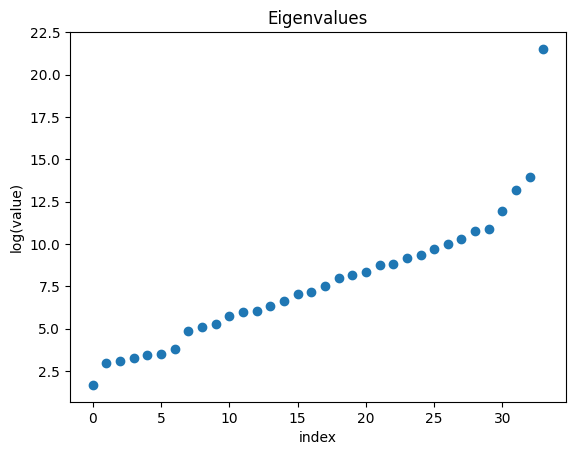

In [1185]:
import matplotlib.pyplot as plt

plt.scatter([i for i in range(len(S))], np.log(S))
plt.title("Eigenvalues")
plt.xlabel("index")
plt.ylabel('log(value)')

Now we want to sort the last vector in the Vt matrix in order to vizualise the variability of our features. The larger values indicate stronger variability. With this we must also sort the 3 before that. As seen in the graph above the last 4 dots are growing at a much faster rate than the rest of the dots. We want to visualize those 4 vectors but we also must keep the sorting consistent so we will store all the values in vectors at the same time to not lose order of our features.

In [1186]:
sorted_feature_weights1 = sorted(Vt[cols-1], reverse=True)
sorted_feature_weights2 = []
sorted_feature_weights3 = []
sorted_feature_weights4 = []
sorted_features = []
for i, w in enumerate(sorted_feature_weights1):
    fInd = np.where(Vt[cols-1] == w)[0][0]
    print(f'{i+1}: {list(features.columns)[fInd]}, {w}')
    sorted_features.append(list(features.columns)[fInd])
    sorted_feature_weights2.append(Vt[cols-2][fInd])
    sorted_feature_weights3.append(Vt[cols-3][fInd])
    sorted_feature_weights4.append(Vt[cols-4][fInd])



1: declined_penalties, -5.220334178869392e-05
2: spikes, -0.0005054548495881552
3: avg_time_to_throw, -0.0007323588300870137
4: twp_rate, -0.0008618514610766669
5: penalties, -0.0010307550109262971
6: btt_rate, -0.001201208629996341
7: hit_as_threw, -0.0014886196994451295
8: sack_percent, -0.0016162291733096824
9: drop_rate, -0.001756534705349256
10: ypa, -0.001934921920677859
11: avg_depth_of_target, -0.002265731961578046
12: bats, -0.0022657561134451745
13: interceptions, -0.002777825579082352
14: player_game_count, -0.003961312978711391
15: pressure_to_sack_rate, -0.004787033310128059
16: turnover_worthy_plays, -0.004991695007488432
17: thrown_aways, -0.00580839362121005
18: drops, -0.006055124117694932
19: touchdowns, -0.00646422860953664
20: big_time_throws, -0.0066101691075036335
21: scrambles, -0.007155191936091852
22: sacks, -0.008816645480609524
23: grades_hands_fumble, -0.016002579250736643
24: completion_percent, -0.017014514899352177
25: grades_run, -0.017995866032649167
26

Now we will put everything together in one graph. We will show a scatter diagram from each of the 4 vectors. We will display the values for each feature individually. This will give us a good idea of the variability of the features so that we can understand which ones will be useful when trying to predict salary and which ones will tell us things we already know and don't need to be trained on at the risk of overfitting.

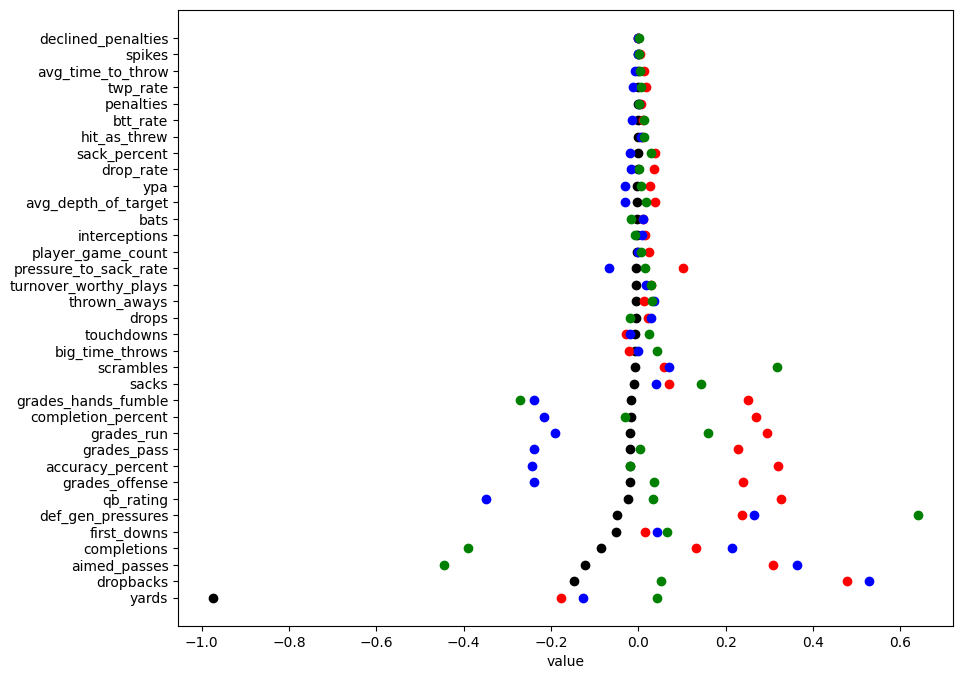

In [1187]:
# scatter plot for all of the vectors
x = [i for i in range(35)]
fig, ax = plt.subplots(figsize=(10, 8))
ax.scatter(sorted_feature_weights1[::-1], x, color='black')
ax.scatter(sorted_feature_weights2[::-1], x, color='red')
ax.scatter(sorted_feature_weights3[::-1], x, color='blue')
ax.scatter(sorted_feature_weights4[::-1], x, color='green')
ax.set_yticks(range(35))
ax.set_yticklabels(sorted_features[::-1])
plt.xlabel("value")
plt.show()


Now we want to explore some of these features individually. Let's start with yards since in our principal component analysis it showed to be the feature with the most variability. Now we want to see how it correlates with our targets.

Text(0.5, 1.0, 'Yards vs AAV')

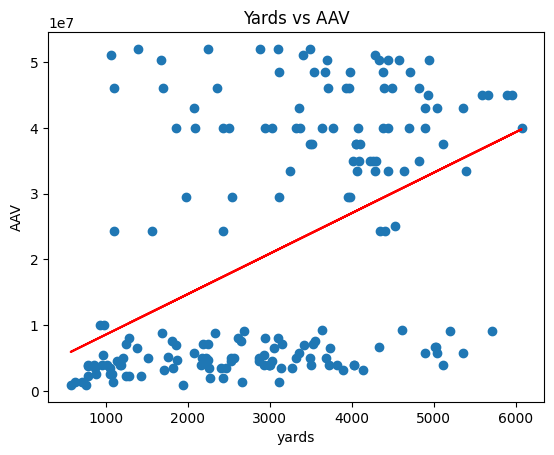

In [1188]:
# yards and average salary relationship
plt.cla()
m, b = np.polyfit(passing_df['yards'], passing_df["AAV"],1)
plt.scatter( passing_df['yards'], passing_df["AAV"],)
plt.plot(passing_df['yards'], m*passing_df['yards'] + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('Yards vs AAV')

It's fairly hard to tell what is going on but we do indeed see a positive correlation between the yards and the salary, with the players earning a higher salary generally throwing for more yards than those who aren't. The next notable feature we want to see is dropbacks.

Text(0.5, 1.0, 'dropbacks vs AAV')

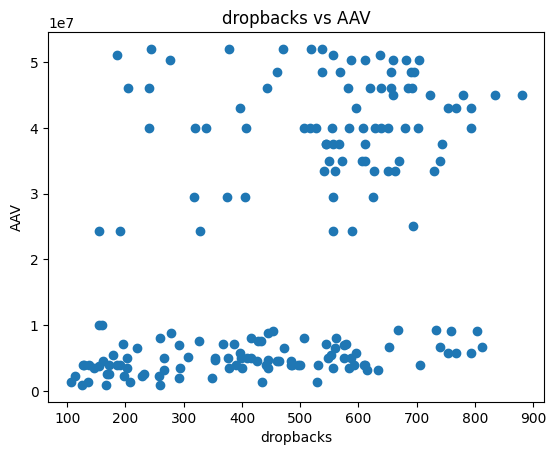

In [1189]:
# AAV and dropbacks relationship
plt.cla()
plt.scatter(passing_df['dropbacks'],passing_df["AAV"])
plt.xlabel('dropbacks')
plt.ylabel('AAV')
plt.title('dropbacks vs AAV')

It looks surprisingly similar. Let's look at pff grade, which again is a grade made by analysts at pro football focus where they grade every play of the player.

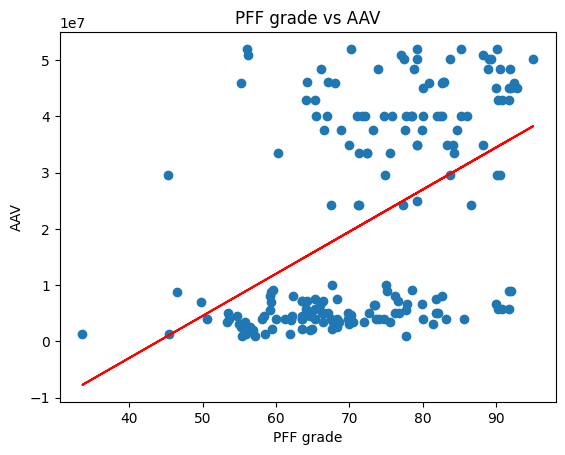

In [1190]:
# AAV and pff grade relationship
plt.cla()
m, b = np.polyfit(passing_df['grades_offense'], passing_df["AAV"],1)
plt.scatter(passing_df['grades_offense'], passing_df["AAV"],)
plt.plot(passing_df['grades_offense'], m*passing_df['grades_offense'] + b, color='red')
plt.xlabel('PFF grade')
plt.ylabel('AAV')
plt.title('PFF grade vs AAV')
plt.show()

What is very noticeable between all of these graphs is the two clusters that appear in the plots. These clusters are separated by salary. The lower cluster represents the players on the rookie contracts while the upper cluster are players who have been paid second contracts, which are significantly higher. When a player is first drafted they are essentially assigned a contract that they play on for 4-5 years before being eligible for a new one. Typically, the rookie contracts are farily cheap, and if the player is good enough they either get extended or sign with another team, typically for a lot more money then they were making in the past. This is a very important thing to distinguish in our data. We will explore this further with a k means analysis which will give us a good idea of the split between our clusters.

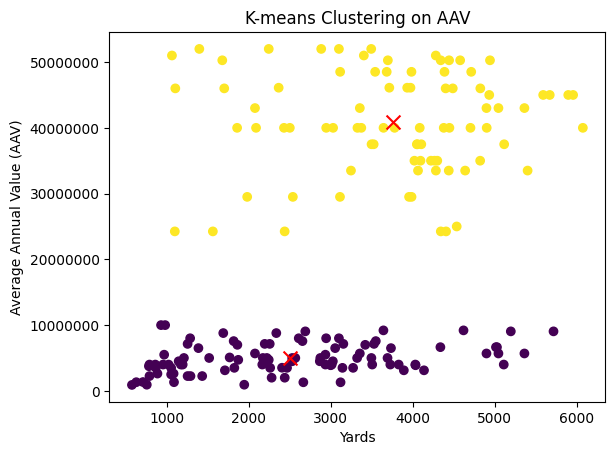

In [1191]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler


# Create a dataset by stacking the features
data = passing_df[['AAV', 'yards']]

# Perform k-means clustering
kmeans = KMeans(n_clusters=2)
kmeans.fit(data)

# Get cluster labels and centroids
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Add cluster labels to the DataFrame
passing_df["Cluster"] = labels

# Plot the scatter plot
plt.scatter(passing_df["yards"], passing_df["AAV"], c=labels, cmap='viridis')
plt.scatter(centroids[:, 1], centroids[:, 0], c='red', marker='x', s=100)

# Set labels and title
plt.ylabel('Average Annual Value (AAV)')
plt.xlabel('Yards')
plt.title('K-means Clustering on AAV')
plt.ticklabel_format(style='plain')

# Display the plot
plt.show()

We get a very clear and obvious cluster, and the data within each cluster is vastly different with the yellow cluster being more condensed and the purple cluster being a lot more spread out.

In [1192]:
from sklearn.linear_model import LinearRegression

data = passing_df[["yards", "AAV", "Cluster"]]

# Split the DataFrame into clusters
cluster_0_df = passing_df[passing_df["Cluster"] == 0]
cluster_1_df = passing_df[passing_df["Cluster"] == 1]

# Perform linear regression within each cluster
linear_regression_0 = LinearRegression()
linear_regression_0.fit(cluster_0_df[["yards"]], cluster_0_df["AAV"])

linear_regression_1 = LinearRegression()
linear_regression_1.fit(cluster_1_df[["yards"]], cluster_1_df["AAV"])

# Print the coefficients for each cluster
print("Cluster 0: Yards Run Coefficient =", linear_regression_0.coef_)
print("Cluster 1: Yards Run Coefficient =", linear_regression_1.coef_)

Cluster 0: Yards Run Coefficient = [594.08385599]
Cluster 1: Yards Run Coefficient = [101.41286478]


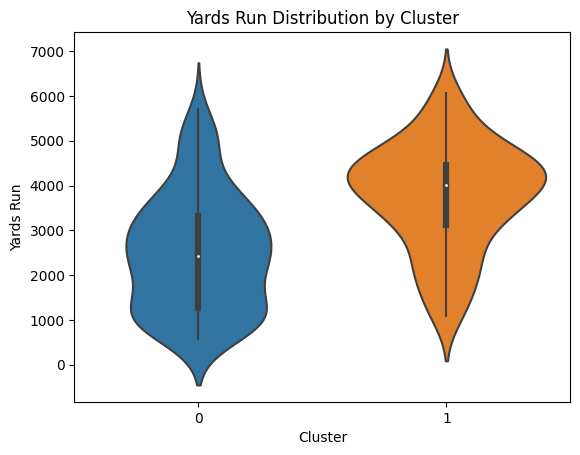

In [1193]:
import seaborn as sns

# Create a violin plot
sns.violinplot(x="Cluster", y="yards", data=data)

# Set labels and title
plt.xlabel('Cluster')
plt.ylabel('Yards Run')
plt.title('Yards Run Distribution by Cluster')

plt.show()

The above violin plot shows that the above 20 million players have a much higher yards run rate than the under 20 million players. This could be explained by how often players are allowed to play. Big name players get paid more, and get more opportunities to run more yards than lower paid players.

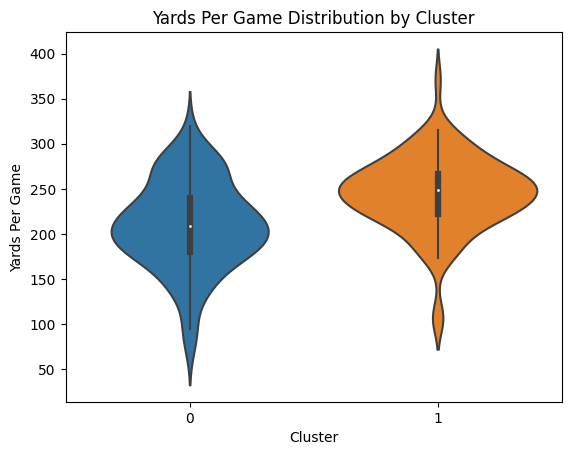

In [1194]:
data = passing_df[["yards", "AAV", "Cluster", "player_game_count"]]

# Calculate yards per game
data["Yards Per Game"] = data["yards"] / data["player_game_count"]

# Create a violin plot
sns.violinplot(x="Cluster", y="Yards Per Game", data=data)

# Set labels and title
plt.xlabel('Cluster')
plt.ylabel('Yards Per Game')
plt.title('Yards Per Game Distribution by Cluster')

plt.show()

This gives us a better picture of how our clusters are distributed. In our left cluster we have more datapoints focused within one area at around 250 yards per game. Our other cluster is a tad more spread with the bulk of datapoints lying around 200 yards per game. We can clearly see there is a correlation between getting paid more and throwing for more yards. But does this mean that we can correlate well within our clusters to find more insightful discoveries? Let's explore further. First let's average out our quarterbacks stats rather than have them seperate by year in order to get a more general picture.

In [1195]:
# create one row per player with their average for each feature
grouped_qbs = passing_df.groupby('player')[numeric_cols].mean()
grouped_qbs.head()


,player_id,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,bats,big_time_throws,btt_rate,...,year,Rank,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year
player,,,,,,,,,,,,,,,,,,,,,
Aaron Rodgers,2241.0,15.500000,76.533333,485.500000,530.5,8.416667,2.763333,3.833333,34.166667,5.85,...,2019.5,11.0,3.0,150815000.0,50271667.0,40800000.0,101515000.0,150815000.0,2022.0,2024.0
Andy Dalton,6187.0,12.166667,73.333333,359.166667,389.5,8.300000,2.525000,7.833333,16.833333,3.95,...,2019.5,492.0,2.0,10000000.0,5000000.0,4835000.0,8000000.0,8000000.0,2023.0,2024.0
Baker Mayfield,46518.0,14.800000,72.260000,427.800000,466.0,8.780000,2.806000,11.800000,26.200000,5.04,...,2020.0,1014.0,1.0,4000000.0,4000000.0,2875000.0,4000000.0,4000000.0,2023.0,2023.0
Blaine Gabbert,6162.0,5.500000,66.050000,129.500000,136.0,8.750000,2.435000,3.500000,5.000000,3.30,...,2017.5,1926.0,1.0,1317500.0,1317500.0,152500.0,1092500.0,1092500.0,2023.0,2023.0
Brian Hoyer,5277.0,8.000000,68.800000,202.000000,211.0,8.400000,2.390000,3.000000,9.000000,4.10,...,2017.0,848.0,2.0,4500000.0,2250000.0,875000.0,4205000.0,4205000.0,2023.0,2024.0


Now we want to see the relationship between a players average yards and their salary.

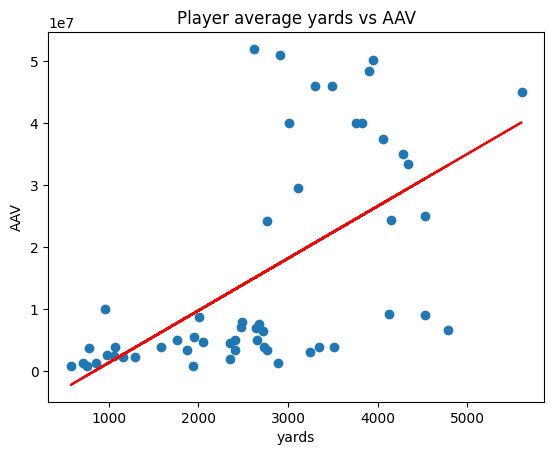

In [1196]:

plt.cla()
m, b = np.polyfit(grouped_qbs['yards'],grouped_qbs['AAV'] , 1)
plt.scatter(grouped_qbs['yards'], grouped_qbs['AAV'],)
plt.plot(grouped_qbs['yards'], grouped_qbs['yards']*m + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('Player average yards vs AAV')
plt.show()

Now let's analyze our clusters. Let's start with the less than 20 million cluster.

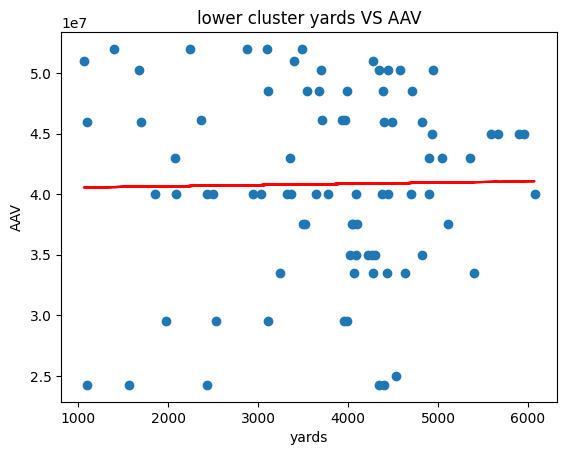

In [1197]:

plt.cla()
# lower salary cluster
m, b = np.polyfit(cluster_1_df['yards'], cluster_1_df['AAV'], 1)
plt.scatter(cluster_1_df['yards'], cluster_1_df['AAV'])
plt.plot(cluster_1_df['yards'], cluster_1_df['yards']*m + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('lower cluster yards VS AAV')
plt.show()

More than 20 million cluster

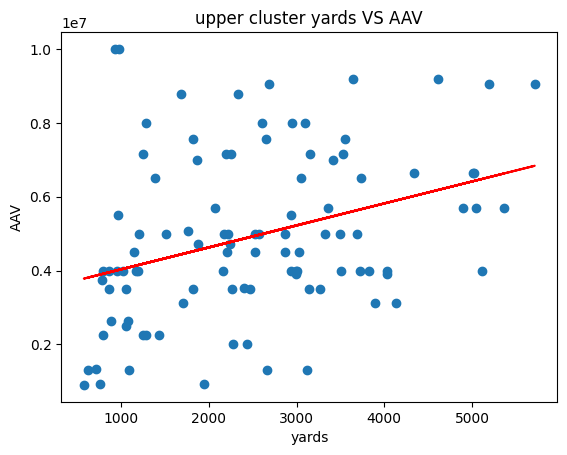

In [1198]:
plt.cla()
# upper salary cluster
m, b = np.polyfit( cluster_0_df['yards'], cluster_0_df['AAV'], 1)
plt.scatter(cluster_0_df['yards'],cluster_0_df['AAV'],)
plt.plot(cluster_0_df['yards'], cluster_0_df['yards']*m + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('upper cluster yards VS AAV')
plt.show()

Now let's look at the relationship between players before they receive their contract.

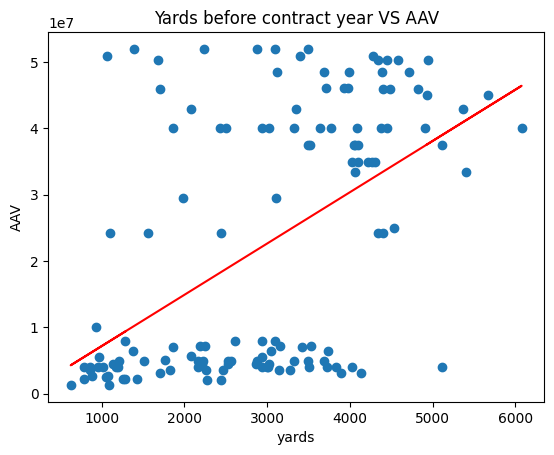

In [1199]:
# yards and average salary relationship
plt.cla()
m, b = np.polyfit(passing_df[passing_df['year'] < passing_df['start_year']]['yards'], passing_df[passing_df['year'] < passing_df['start_year']]["AAV"],1)
plt.scatter(passing_df[passing_df['year'] < passing_df['start_year']]['yards'], passing_df[passing_df['year'] < passing_df['start_year']]["AAV"],)
plt.plot(passing_df[passing_df['year'] < passing_df['start_year']]['yards'], m*passing_df[passing_df['year'] < passing_df['start_year']]['yards'] + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('Yards before contract year VS AAV')
plt.show()

Now let's look at how players perform after they receive their contracts.

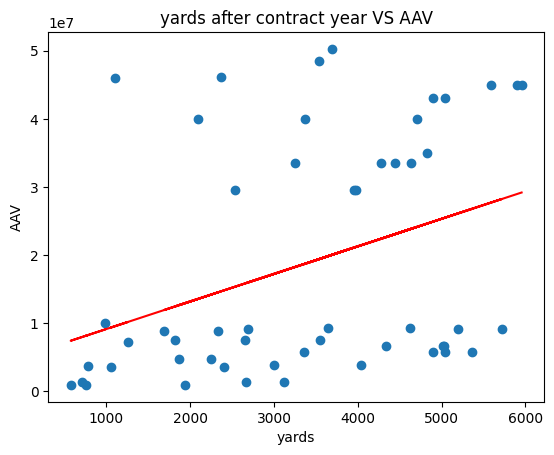

In [1200]:

# yards and average salary relationship
plt.cla()
m, b = np.polyfit(passing_df[passing_df['year'] >= passing_df['start_year']]['yards'], passing_df[passing_df['year'] >= passing_df['start_year']]["AAV"],1)
plt.scatter(passing_df[passing_df['year'] >= passing_df['start_year']]['yards'], passing_df[passing_df['year'] >= passing_df['start_year']]["AAV"],)
plt.plot(passing_df[passing_df['year'] >= passing_df['start_year']]['yards'], m*passing_df[passing_df['year'] >= passing_df['start_year']]['yards'] + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('yards after contract year VS AAV')
plt.show()

Now let's explore the upper cluster, the quarterbacks who have received a notable second contract. Understanding these players will help us use our data to figure out how to better predict what contracts should look like. 

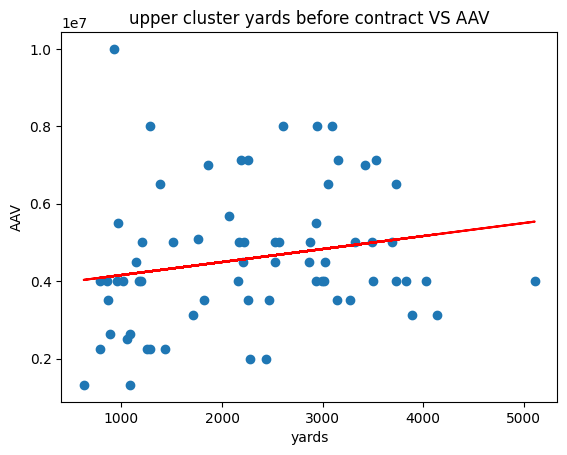

In [1201]:

# yards before contract and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]["AAV"],1)
plt.scatter(cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]["AAV"],)
plt.plot(cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'], m*cluster_0_df[cluster_0_df['year'] < cluster_0_df['start_year']]['yards'] + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('upper cluster yards before contract VS AAV')
plt.show()

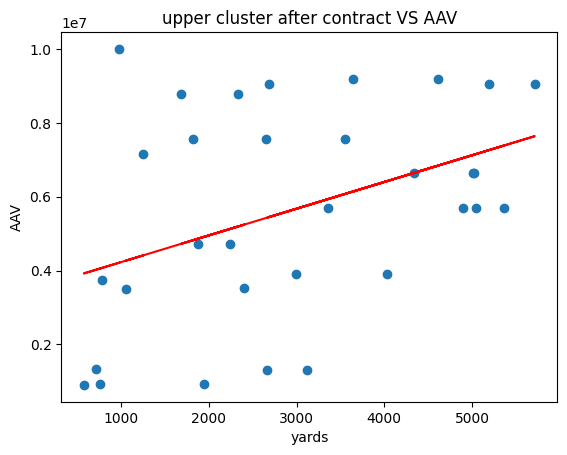

In [1202]:

# yards after contract and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]["AAV"],1)
plt.scatter(cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'], cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]["AAV"],)
plt.plot(cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'], m*cluster_0_df[cluster_0_df['year'] >= cluster_0_df['start_year']]['yards'] + b, color='red')
plt.xlabel('yards')
plt.ylabel('AAV')
plt.title('upper cluster after contract VS AAV')
plt.show()

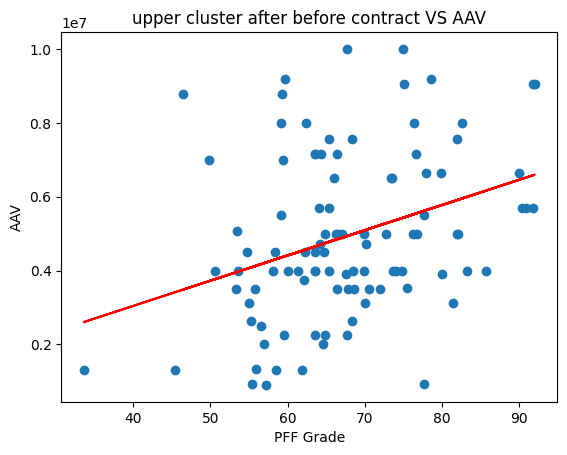

In [1203]:
# pff grade and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df['grades_offense'], cluster_0_df["AAV"],1)
plt.scatter(cluster_0_df['grades_offense'], cluster_0_df["AAV"],)
plt.plot(cluster_0_df['grades_offense'], m*cluster_0_df['grades_offense'] + b, color='red')
plt.xlabel('PFF Grade')
plt.ylabel('AAV')
plt.title('upper cluster after before contract VS AAV')
plt.show()

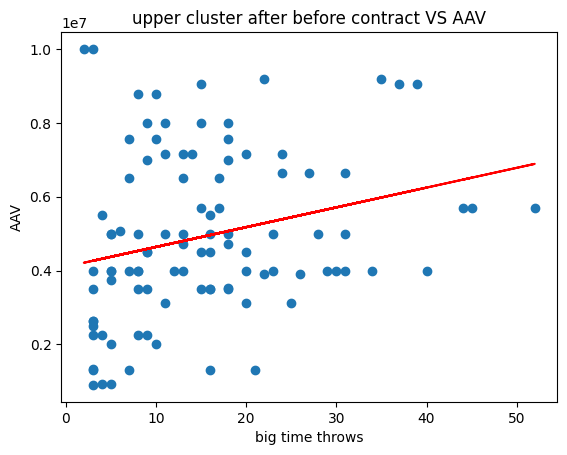

In [1204]:
# big time throws and average salary relationship
plt.cla()
m, b = np.polyfit(cluster_0_df['big_time_throws'], cluster_0_df["AAV"],1)
plt.scatter(cluster_0_df['big_time_throws'], cluster_0_df["AAV"],)
plt.plot(cluster_0_df['big_time_throws'], m*cluster_0_df['big_time_throws'] + b, color='red')
plt.xlabel('big time throws')
plt.ylabel('AAV')
plt.title('upper cluster after before contract VS AAV')
plt.show()

There appears to be high correlation between salary and yards for players who are paid less. However, for players that are paid high, there is negiligeable correlation, which means that it is both not strong and not a good predictor for future salary. However, we do see slightly more promise with other features such as big time throws and pff grade. We will now further explore feature selection in order to see if we can select a good amounut of features that will be able to predict salary together. We want to now figure out any features that are redundant with each other or irrelevant to predicting the salary. Understanding our data in this way will allow for cleaner built models that converge quicker, generalize and produce more accurate results more efficiently. We will start by seeing how our features correlate with the AAV and to drop features in which there are none.

In [1205]:
targets = ['Value', 'AAV', 'Sign Bonus', "G'teed @ Sign", "Practical G'teed"]
# features = passing_df.select_dtypes(include=[np.number])
aav_corr = passing_df[list(features.columns) + ['AAV']].corr()['AAV']
abs(aav_corr).sort_values()

grades_hands_fumble      0.006347
declined_penalties       0.016309
sack_percent             0.052691
hit_as_threw             0.067132
pressure_to_sack_rate    0.073608
interceptions            0.093357
avg_depth_of_target      0.104274
drop_rate                0.115099
bats                     0.126030
spikes                   0.195554
grades_run               0.222153
twp_rate                 0.226182
avg_time_to_throw        0.232858
turnover_worthy_plays    0.235923
penalties                0.238186
completion_percent       0.278084
accuracy_percent         0.299559
drops                    0.313104
sacks                    0.359197
scrambles                0.361284
btt_rate                 0.381266
ypa                      0.392588
thrown_aways             0.405443
aimed_passes             0.407426
def_gen_pressures        0.423763
dropbacks                0.424293
completions              0.425303
player_game_count        0.428411
grades_pass              0.450613
yards         

The cutoff we will decide on is spikes, which based on intuition about football has very little to do with analying performance of a player. Everything with less correlation to AAV than that will also be dropped.

In [1206]:
aav_corr = aav_corr[aav_corr > 0.21]
features = features[aav_corr.drop('AAV').index]
aav_corr

player_game_count        0.428411
accuracy_percent         0.299559
aimed_passes             0.407426
avg_time_to_throw        0.232858
big_time_throws          0.467984
btt_rate                 0.381266
completion_percent       0.278084
completions              0.425303
def_gen_pressures        0.423763
dropbacks                0.424293
drops                    0.313104
first_downs              0.457885
grades_offense           0.474365
grades_pass              0.450613
grades_run               0.222153
penalties                0.238186
qb_rating                0.491506
sacks                    0.359197
scrambles                0.361284
thrown_aways             0.405443
touchdowns               0.500041
turnover_worthy_plays    0.235923
yards                    0.456133
ypa                      0.392588
AAV                      1.000000
Name: AAV, dtype: float64

Now we have reduced our feature set a little bit. Now we want to remove features that are redundant with each other. To do this we will use the pandas scatter matrix plotting function to visualise this intuitively. What this does is that it will plot the correlation between every feature individually. With this we can see features that are highly correlated and therefore redundant with each other.

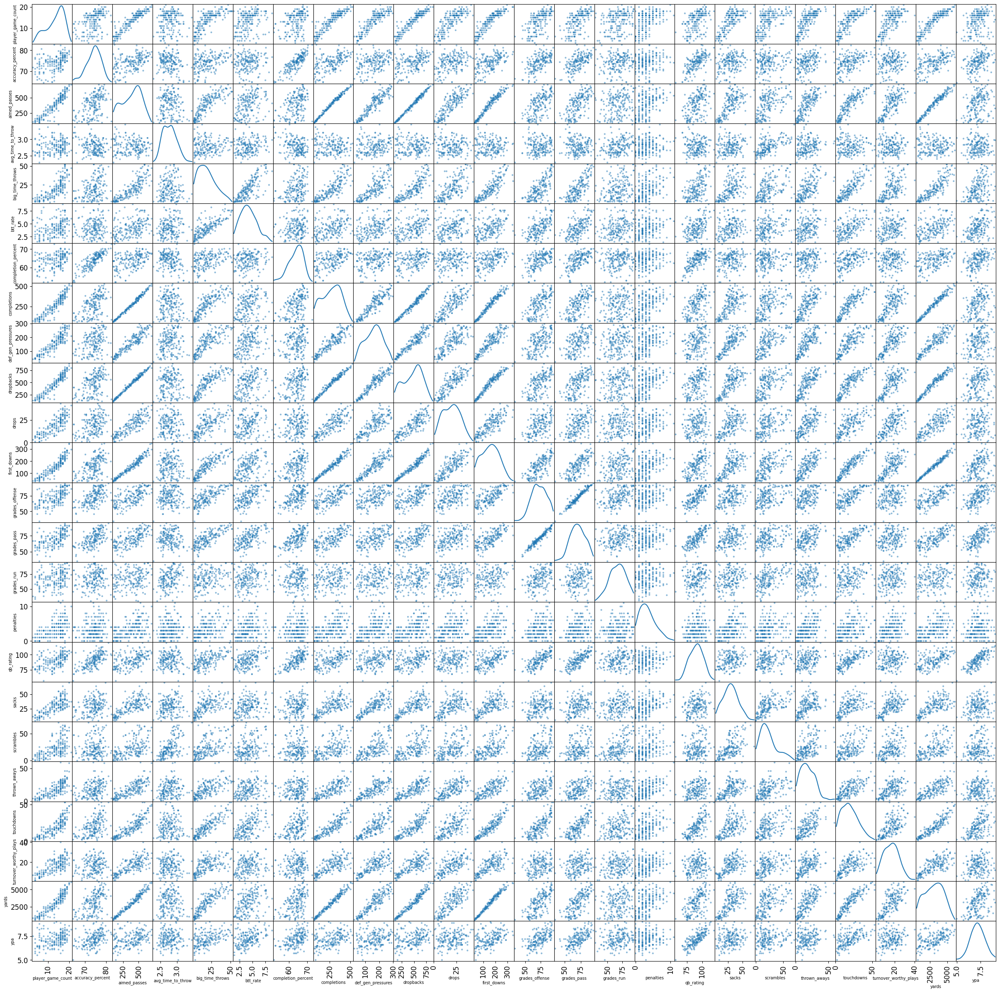

In [1207]:
pd.plotting.scatter_matrix(features[aav_corr.drop('AAV').index], diagonal='kde', figsize=(30, 30))
for ax in plt.gcf().axes:
    ax.tick_params(labelsize=12)
    ax.xaxis.label.set_fontsize(7)
    ax.yaxis.label.set_fontsize(7)
plt.show()

From this graph we can observe a few datapoints to drop. First off aimed passes is a highly redundant feature so we will drop it. Other features are similar, including completions, dropbacks, first downs, big time throws and yards. Because big time throws is the most correlated with AAV we will keep that one and drop the others. Offense and passing grades are also highly redundant as passing grade is a subset of the offensive grade, we will drop this. We can see some correlation in other areas but we will leave those for now. This leaves us with now 18 features.

In [1208]:
features = features.drop(['aimed_passes', 'completions', 'dropbacks', 'first_downs', 'grades_pass', 'yards'], axis=1)
corr_matrix = features.corr()
corr_matrix

,player_game_count,accuracy_percent,avg_time_to_throw,big_time_throws,btt_rate,completion_percent,def_gen_pressures,drops,grades_offense,grades_run,penalties,qb_rating,sacks,scrambles,thrown_aways,touchdowns,turnover_worthy_plays,ypa
player_game_count,1.000000,0.429301,0.106279,0.771449,0.350963,0.356686,0.887609,0.798986,0.622563,0.280995,0.516761,0.471123,0.745610,0.573988,0.741764,0.814860,0.714925,0.343643
accuracy_percent,0.429301,1.000000,-0.236996,0.352143,0.069451,0.846772,0.354767,0.380792,0.589441,0.130464,0.174149,0.668179,0.277918,0.114632,0.337410,0.488296,0.122814,0.423530
avg_time_to_throw,0.106279,-0.236996,1.000000,0.081180,0.174864,-0.307558,0.193680,-0.021261,0.056650,0.331953,0.140061,-0.027110,0.183925,0.588670,0.208568,0.033477,0.030151,0.012928
big_time_throws,0.771449,0.352143,0.081180,1.000000,0.787809,0.343830,0.780611,0.687378,0.751245,0.289903,0.395467,0.567822,0.569003,0.519511,0.667384,0.876833,0.595736,0.450656
btt_rate,0.350963,0.069451,0.174864,0.787809,1.000000,0.144231,0.385715,0.282201,0.594728,0.234412,0.216540,0.480798,0.282273,0.334100,0.328060,0.561475,0.256329,0.456562
completion_percent,0.356686,0.846772,-0.307558,0.343830,0.144231,1.000000,0.272353,0.163420,0.551004,0.066930,0.126864,0.718756,0.235683,0.079652,0.130885,0.467056,0.105082,0.493257
def_gen_pressures,0.887609,0.354767,0.193680,0.780611,0.385715,0.272353,1.000000,0.771289,0.571424,0.300105,0.433304,0.389149,0.798406,0.667269,0.750013,0.780052,0.739820,0.268537
drops,0.798986,0.380792,-0.021261,0.687378,0.282201,0.163420,0.771289,1.000000,0.526495,0.228217,0.348376,0.269346,0.561221,0.449563,0.645606,0.691049,0.662755,0.155595
grades_offense,0.622563,0.589441,0.056650,0.751245,0.594728,0.551004,0.571424,0.526495,1.000000,0.432749,0.268649,0.738142,0.406347,0.434818,0.484112,0.755472,0.261421,0.603901
grades_run,0.280995,0.130464,0.331953,0.289903,0.234412,0.066930,0.300105,0.228217,0.432749,1.000000,0.139046,0.206942,0.248046,0.528583,0.210652,0.303622,0.200937,0.161662


In [1209]:
features.columns

Index(['player_game_count', 'accuracy_percent', 'avg_time_to_throw',
       'big_time_throws', 'btt_rate', 'completion_percent',
       'def_gen_pressures', 'drops', 'grades_offense', 'grades_run',
       'penalties', 'qb_rating', 'sacks', 'scrambles', 'thrown_aways',
       'touchdowns', 'turnover_worthy_plays', 'ypa'],
      dtype='object')

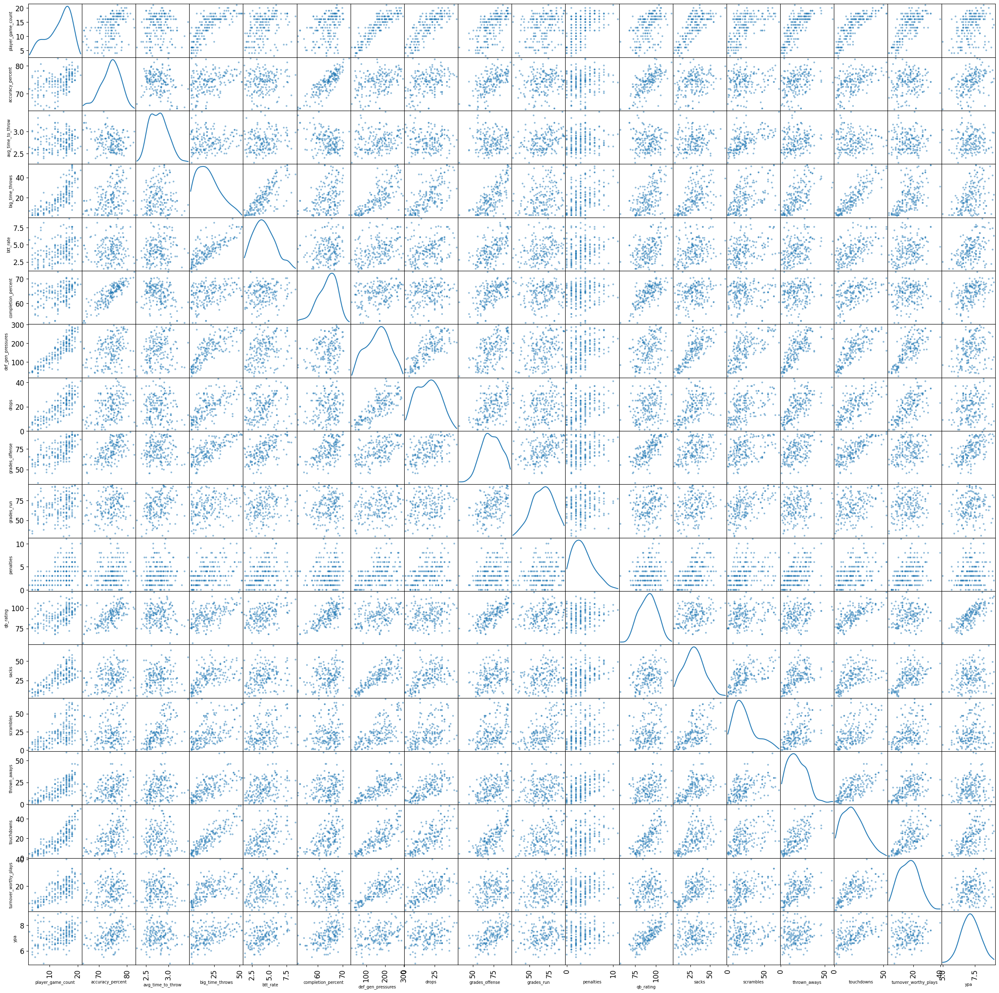

In [1210]:
pd.plotting.scatter_matrix(features[corr_matrix.index], diagonal='kde', figsize=(30, 30))
for ax in plt.gcf().axes:
    ax.tick_params(labelsize=12)
    ax.xaxis.label.set_fontsize(7)
    ax.yaxis.label.set_fontsize(7)
plt.show()

Nothing seems blatenly correlated. Now we want to test how many features are considered valueable for our dataset. For this we will do a sequential feature selection and test out how effective the number of features are on a linear regression model. The SequencialFeatureSelection from sklearn is a greedy algorithm which will recursively select the next best feature for the model and go up to the specified amount. We looped over all possible number of features to see if it converged early so that we could possibly remove some features.

In [1211]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Create a LinearRegression model
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(features, passing_df['AAV'], test_size=0.2, random_state=42)

for i in range(1, len(features.columns)):
    # Create a SequentialFeatureSelector
    sfs = SequentialFeatureSelector(lr, n_features_to_select=i, direction='forward')
    # Fit the SequentialFeatureSelector on the data
    sfs.fit(X_train, y_train)
    # Get the selected feature indices
    selected_features = sfs.get_support(indices=True)
    selected_feature_names = list(features.columns[selected_features])
    lr.fit(X_train[selected_feature_names], y_train)
    r_squared = lr.score(X_test[selected_feature_names], y_test)
    print(f'{i} features, R-squared: {r_squared}')  


1 features, R-squared: 0.21118748880528926
2 features, R-squared: 0.2576296414643814
3 features, R-squared: 0.28466466108365107
4 features, R-squared: 0.278937122155114
5 features, R-squared: 0.26488449127433245
6 features, R-squared: 0.2798738491302688
7 features, R-squared: 0.25193832762101587
8 features, R-squared: 0.24663356458398034
9 features, R-squared: 0.24685734264820813
10 features, R-squared: 0.24478652071674945
11 features, R-squared: 0.2062656934835474
12 features, R-squared: 0.2109990934809186
13 features, R-squared: 0.19181530727627738
14 features, R-squared: 0.192877458027372
15 features, R-squared: 0.19177761918834657
16 features, R-squared: 0.19176193354482785
17 features, R-squared: 0.1703269891573178


There is a big jump from 15 to 16 features but there is not as big of one from 16 to 17, so we will move forward with the top 16 features.

In [1212]:
sfs = SequentialFeatureSelector(lr, n_features_to_select=16, direction='forward')
sfs.fit(X_train, y_train)
# Get the selected feature indices
selected_features = sfs.get_support(indices=True)
selected_feature_names = list(features.columns[selected_features]) + ['start_year']
features = passing_df[selected_feature_names]
features.columns

Index(['player_game_count', 'accuracy_percent', 'avg_time_to_throw',
       'btt_rate', 'completion_percent', 'def_gen_pressures', 'drops',
       'grades_offense', 'grades_run', 'qb_rating', 'sacks', 'scrambles',
       'thrown_aways', 'touchdowns', 'turnover_worthy_plays', 'ypa',
       'start_year'],
      dtype='object')

Now we will do some machine learning to create a model that can predict salary. We will use some of the observations we used from our exploration analysis to experiment with multiple models. For the most part, we will be using neural networks. We will be using tensorflow, a python library that creates neural networks and performs calculations into a model. It allows us to specify how many hidden layers and nodes we have. The finer details are handeled on the back end like the weight adjustments, which will determine how we get from input to output. For our model, we will use 1 output since our targets are already closely correlated. We will use relu activation function which will not allow us to have negative values ane we will normalize all our data. We will train on 80% of our data and hold out 20% for testing. We will have 2 hidden layers.

In [1213]:
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from sklearn.metrics import r2_score

# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [1214]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [1215]:
from sklearn.metrics import r2_score
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

2/2 [==============================] - 0s 19ms/step
R^2 score: -0.011388628736443529


Text(0, 0.5, 'predicted data')

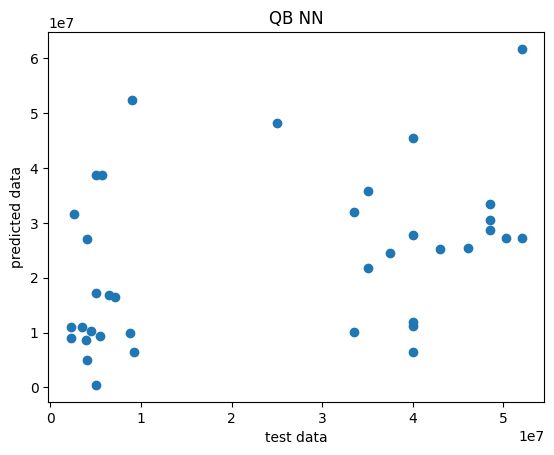

In [1216]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN')
plt.xlabel('test data')
plt.ylabel('predicted data')


Let's now train on how players perform before their contract.

In [1217]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = passing_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [1218]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [1219]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 48ms/step
R^2 score: -0.07452162042547705


Text(0, 0.5, 'predicted data')

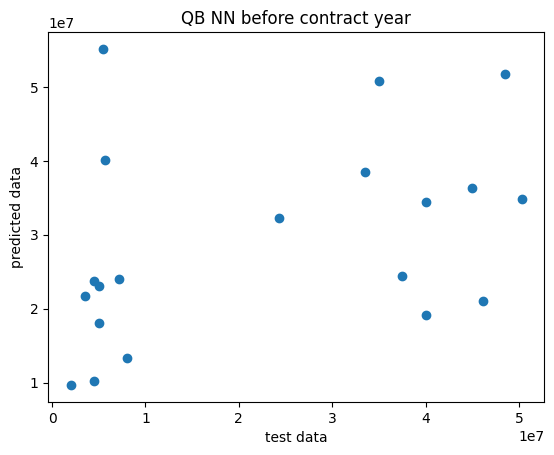

In [1220]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN before contract year')
plt.xlabel('test data')
plt.ylabel('predicted data')

In [1221]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = cluster_1_df[passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [1222]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [1223]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 51ms/step
R^2 score: 0.7177021208520681


Text(0, 0.5, 'predicted data')

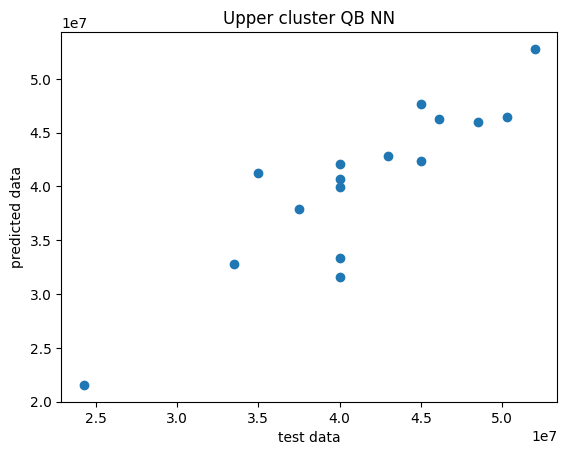

In [1224]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('Upper cluster QB NN')
plt.xlabel('test data')
plt.ylabel('predicted data')

Now lets train on our upper cluster before they receive their contracts.

In [1225]:
features = cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [1226]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [1227]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score (test):', r2)

1/1 [==============================] - 0s 48ms/step
R^2 score (test): 0.627330346399253


In [1228]:
nn = model

Text(0, 0.5, 'predicted data')

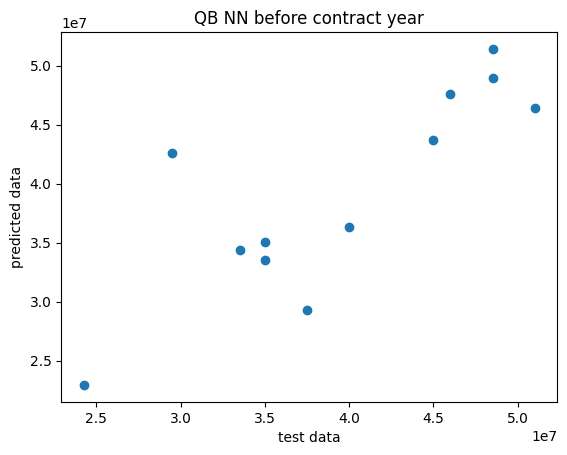

In [1229]:
plt.cla()
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN before contract year')
plt.xlabel('test data')
plt.ylabel('predicted data')

Lets train on quarterbacks after they receive their contracts.

In [1230]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = passing_df[passing_df['start_year'] >= passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[passing_df['start_year'] >= passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [1231]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [1232]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 58ms/step
R^2 score: 0.24974837664501404


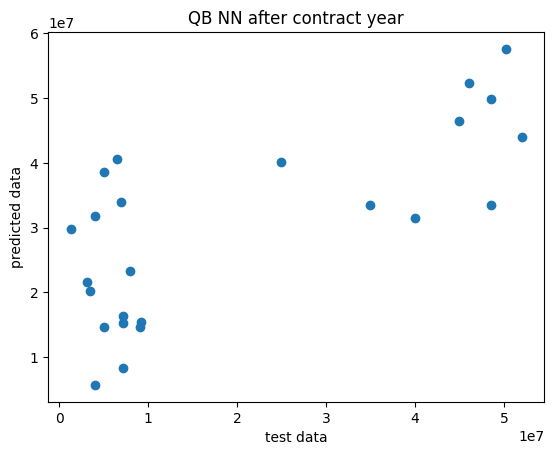

In [1233]:
plt.plot(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred), 'o')
plt.title('QB NN after contract year')
plt.xlabel('test data')
plt.ylabel('predicted data')
plt.show()

In [1234]:
passing_df[passing_df['year'] < passing_df['start_year']]
features = cluster_1_df[passing_df['start_year'] <= passing_df['year']][selected_feature_names]
# get training and testing data
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] <= passing_df['year']][['AAV']], test_size=0.2, random_state=42)
# normalize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(31, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')

In [1235]:
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=100, batch_size=32, verbose=False)

In [1236]:
y_pred = model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
print('R^2 score:', r2)

1/1 [==============================] - 0s 53ms/step
R^2 score: -0.1233497912179422


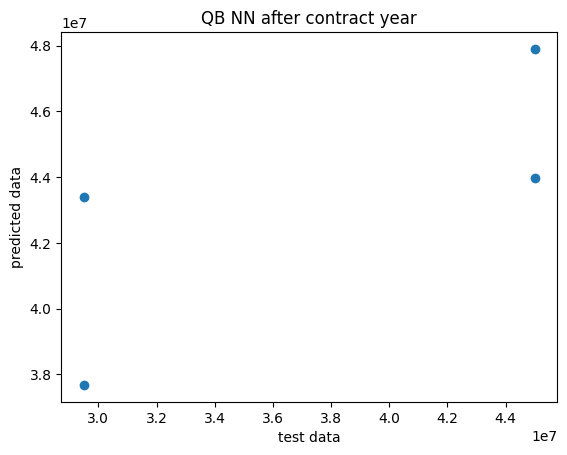

In [1237]:
plt.scatter(scaler.inverse_transform(y_test), scaler.inverse_transform(y_pred))
plt.title('QB NN after contract year')
plt.xlabel('test data')
plt.ylabel('predicted data')
plt.show()

There simply isn't enough data to make any conclusions from here. From our neural network we found that both our upper cluster and players before their contract offer more accurate training data. The most accurate we got was the model where we trained on the cluster of quarterbacks that received their second contracts and look at how they played before their contracts. This proved to be a fairly accurate model in terms of being able to predict salary on our testing data. Now lets try a couple of other machine learning models starting with K-nearest neighbors. This is a model which takes a new data point and looks at the points around it that are known and makes a prediction based off of them. Sklearn has a function that allows us to do this while specifying the amount of neighbors we want to observe.

In [1238]:
from sklearn.neighbors import KNeighborsRegressor

features = passing_df[selected_feature_names]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, passing_df[['AAV']], test_size=0.2, random_state=42)

# Create KNN regressor
knn = KNeighborsRegressor(n_neighbors=20)

# Fit the model on the training data
knn.fit(X_train, y_train)

# Predict on the test data
y_pred = knn.predict(X_test)

# Evaluate the model
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: 0.18713357714675938


In [1239]:
features = cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][selected_feature_names]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] > passing_df['year']][passing_df['dropbacks'] > 300][['AAV']], test_size=0.2, random_state=42)

# Create KNN regressor
knn = KNeighborsRegressor(n_neighbors=5)

# Fit the model on the training data
knn.fit(X_train, y_train)

# Predict on the test data
y_pred = knn.predict(X_test)

# Evaluate the model
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: 0.5071571158161005


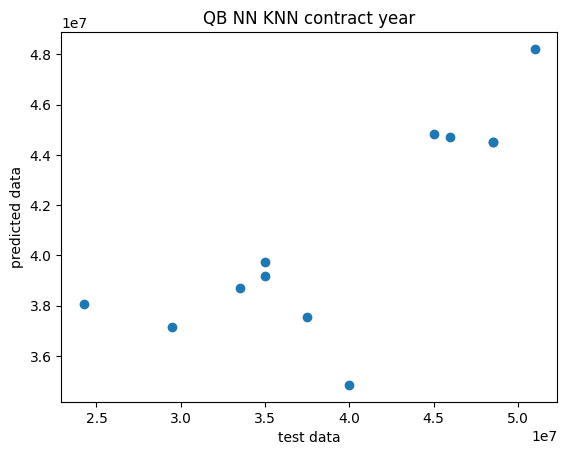

In [1240]:
plt.plot(y_test, y_pred, 'o')
plt.title('QB NN KNN contract year')
plt.xlabel('test data')
plt.ylabel('predicted data')
plt.show()

This is comparable to our neural net but still a pretty good model in terms of what we're looking for. Now let's try linear regression.

In [1241]:
features = passing_df[selected_feature_names]
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, passing_df['AAV'], test_size=0.2, random_state=42)

# Create a linear regression model
lr = LinearRegression()

# Fit the model to the training data
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: 0.19389308395354077


In [1242]:
features = cluster_1_df[passing_df['start_year'] > passing_df['year']][selected_feature_names]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, cluster_1_df[passing_df['start_year'] > passing_df['year']][['AAV']], test_size=0.2, random_state=42)

# Create a linear regression model
lr = LinearRegression()

# Fit the model to the training data
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
print("R^2 Score:", r2_score(y_test, y_pred))

R^2 Score: 0.1798502543317403


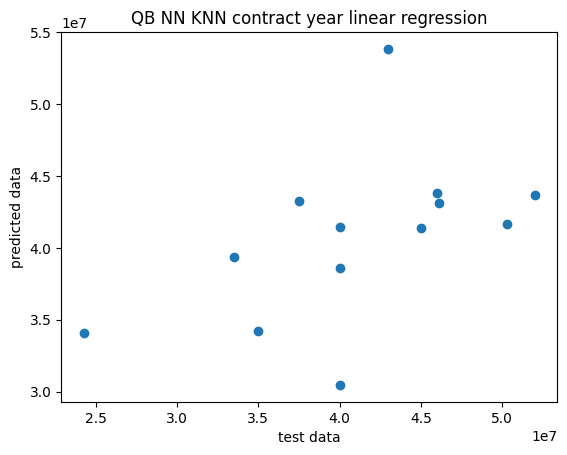

In [1243]:
plt.plot(y_test, y_pred, 'o')
plt.title('QB NN KNN contract year linear regression')
plt.xlabel('test data')
plt.ylabel('predicted data')
plt.show()

This is clearly not as good as our KNN or neural network. Now let's use our models to predict the average salary of the next two quarterbacks anticipated to get massive contracts, Joe Burrow and Justin Herbert.

In [1244]:
justin_herbert = passing_df[passing_df['player'] == 'Justin Herbert']
justin_herbert

,player,player_id,position,team_name,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,...,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year,Cluster
5,Justin Herbert,28237,QB,LAC,18,78.8,673,743,6.9,2.74,...,22,4,26578755,6644689,16890004,26578755,26578755,2020,2024,0
6,Justin Herbert,28237,QB,LAC,17,77.1,624,672,7.9,2.72,...,22,4,26578755,6644689,16890004,26578755,26578755,2020,2024,0
7,Justin Herbert,28237,QB,LAC,15,75.8,553,595,7.8,2.61,...,22,4,26578755,6644689,16890004,26578755,26578755,2020,2024,0


In [1245]:
joe_burrow = passing_df[passing_df['player'] == 'Joe Burrow']
joe_burrow

,player,player_id,position,team_name,player_game_count,accuracy_percent,aimed_passes,attempts,avg_depth_of_target,avg_time_to_throw,...,Signed Age,Yrs,Value,AAV,Sign Bonus,G'teed @ Sign,Practical G'teed,start_year,end_year,Cluster
8,Joe Burrow,28022,QB,CIN,19,77.3,660,715,7.6,2.50,...,23,4,36190137,9047534,23880100,36190137,36190137,2020,2024,0
9,Joe Burrow,28022,QB,CIN,20,79.8,619,662,8.2,2.62,...,23,4,36190137,9047534,23880100,36190137,36190137,2020,2024,0
10,Joe Burrow,28022,QB,CIN,10,73.5,381,404,8.9,2.60,...,23,4,36190137,9047534,23880100,36190137,36190137,2020,2024,0


In [1246]:
print("Justin Herbert estimated contract:", max(knn.predict(justin_herbert[selected_feature_names]))[0])

Justin Herbert estimated contract: 43103529.4


In [1247]:
print("Joe Burrow estimated contract:", max(knn.predict(joe_burrow[selected_feature_names]))[0])

Joe Burrow estimated contract: 41957862.8


Based on real life intuition, these predictions are a bit on the lower side, possibly due to not being able to account for inflation without limiting the dataset too much. After exploring and analyzing the NFL player stats data, we observed several interesting findings. We found that certain features like yards, completions and dropbacks were highly correlated and not needed in a predictive model. Additionally, we were able to use machine learning techniques such as neural networks and K-Nearest Neighbors to predict player performance based on their data. This project goes through the data science lifecycle. We started with data collection and processing, moving on to exploration to better understand the data and identify any issues or missing values. We went through feature selection, selecting and transforming relevant features to improve model performance. Next, we used various machine learning algorithms to build models and make predictions on player performance. Overall, this project demonstrates the importance of using exploratory data analysis and machine learning techniques to gain insights from complex data. It highlights the iterative nature of the data science lifecycle, where each step informs and improves the subsequent steps, ultimately leading to a better understanding of the data and better models. We also proved a hypothesis that based on certain data we can predict players contracts on a certain interval of confidence.

In conclusion, our analysis of NFL player performance before and after signing contracts provides valuable insights into the justification of player salaries and performance outcomes. By examining a range of features and utilizing machine learning techniques, we gained a deeper understanding of the relationship between performance and contract values.

Our findings indicate that performance before signing a contract showed a strong correlation with the subsequent salary received by players. This suggests that teams and decision-makers in the NFL consider pre-contract performance as a crucial factor when determining player salaries. Players who demonstrated exceptional performance in these areas were more likely to secure higher-paying contracts.

However, our analysis also revealed that the correlation between performance after signing a contract and salary was not as pronounced. While certain features such as big-time throws and PFF grade showed potential as predictors, the overall relationship between post-contract performance and salary was less significant. This suggests that other factors, such as team dynamics, coaching, and player development, might influence post-contract performance to a greater extent than the initial performance that justified the contract.

It is important to note that our analysis focused solely on statistical correlations and does not capture the full context and complexity of player evaluations in the NFL. Factors such as player injuries, team schemes, and player roles within the team might also play a significant role in post-contract performance.

Therefore, while pre-contract performance seems to be an influential factor in justifying player salaries, post-contract performance cannot be solely determined by pre-contract performance. Additional factors beyond individual player statistics should be considered when evaluating player performance and contract value.

In summary, our analysis provides insights into the relationship between player performance before and after signing contracts in the NFL. It highlights the importance of pre-contract performance in justifying player salaries but suggests that post-contract performance is influenced by various other factors. Further research and consideration of contextual factors are necessary to comprehensively evaluate the value and impact of player contracts in the NFL.

Helpful links:

PFF player grading: https://www.pff.com/grades

PFF passing grades: https://premium.pff.com/nfl/positions/2022/REGPO/passing?position=QB

PFF receiving grades: https://premium.pff.com/nfl/positions/2022/REGPO/receiving?position=QB

PFF rushing grades: https://premium.pff.com/nfl/positions/2022/REGPO/rushing?position=WR,TE,RB

PFF blocking grades: https://premium.pff.com/nfl/positions/2022/REGPO/offense-blocking?position=HB,FB

PFF run defense grades: https://premium.pff.com/nfl/positions/2022/REGPO/defense-run?position=T,G,C,TE,RB

PFF pass rush grades: https://premium.pff.com/nfl/positions/2022/REGPO/defense-pass-rush?position=DI,ED,LB,CB,S

PFF coverage grades: https://premium.pff.com/nfl/positions/2022/REGPO/defense-coverage?position=DI,ED,LB,CB,S

Salary info: https://www.spotrac.com/nfl/contracts//

More NFL stats: https://www.pro-football-reference.com/